# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [3]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [7]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [8]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [9]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return  torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [13]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [16]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [17]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [18]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1),
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [19]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Make sure there's no sigmoid
    assert test_input.max() > 1
    assert test_input.min() < -1

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [21]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [22]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [39]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####

    pred_fake = gen(get_noise(num_images, z_dim, device=device))
    pred_fake.detach_()
    fake_loss = criterion(disc(pred_fake), torch.zeros((num_images,1),device = device))
    real_loss = criterion(disc(real),torch.ones((num_images,1),device = device))
    disc_loss = (fake_loss+real_loss)/2.0
    
    
    #### END CODE HERE ####
    return disc_loss

In [40]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [43]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    pred_fake = gen(get_noise(num_images, z_dim, device=device))
    out = disc(pred_fake)
    gen_loss = criterion(out, torch.ones(num_images, 1).to(device))

    #### START CODE HERE ####

    #### END CODE HERE ####
    return gen_loss

In [4]:
num_=2
torch.ones(num_, 1)

tensor([[1.],
        [1.]])

In [44]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Step 500: Generator loss: 1.4692419142723094, discriminator loss: 0.40805225402116735


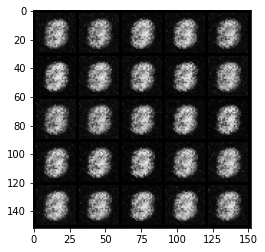

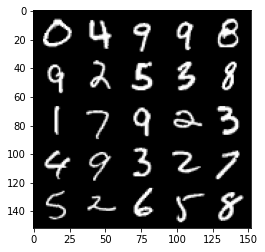

Step 1000: Generator loss: 1.7668301594257347, discriminator loss: 0.2768515677154066


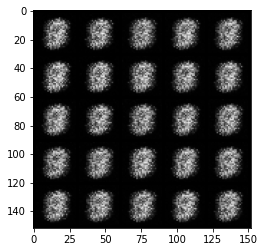

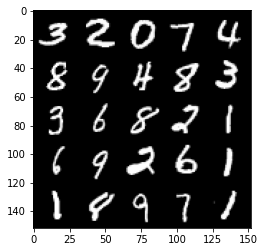

Step 1500: Generator loss: 2.066118692874908, discriminator loss: 0.1601395890265703


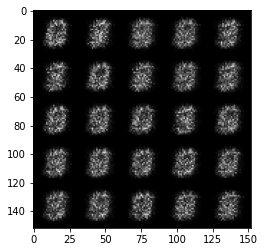

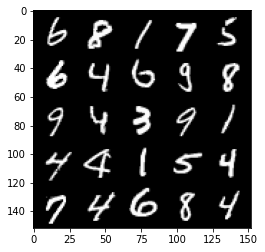

Step 2000: Generator loss: 1.7564664680957809, discriminator loss: 0.2075472634732723


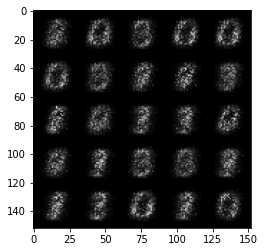

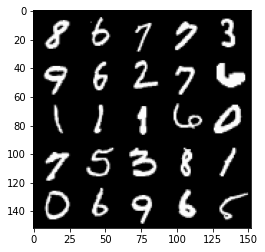

Step 2500: Generator loss: 1.6468749175071715, discriminator loss: 0.2201433281898499


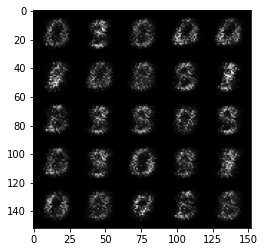

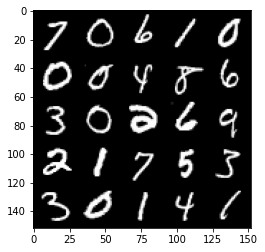

Step 3000: Generator loss: 1.8843552117347695, discriminator loss: 0.17862382960319517


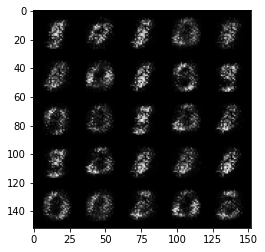

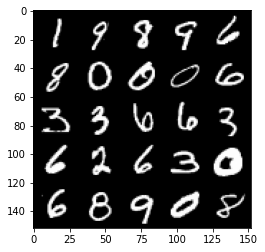

Step 3500: Generator loss: 2.34297256231308, discriminator loss: 0.12841526067256936


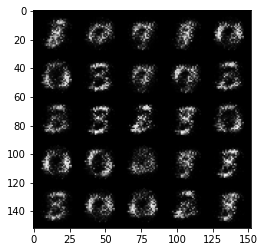

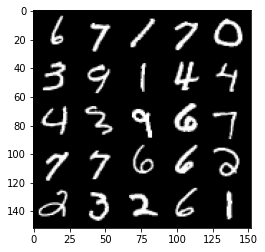

Step 4000: Generator loss: 2.8268571133613576, discriminator loss: 0.09886616750061517


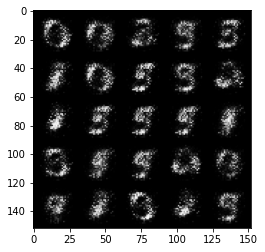

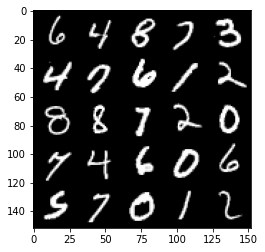

Step 4500: Generator loss: 3.2639796791076687, discriminator loss: 0.08522405962646008


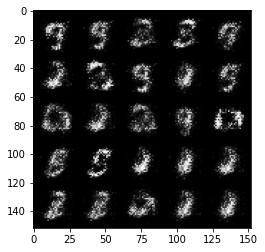

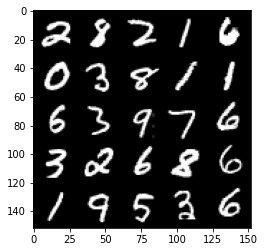

Step 5000: Generator loss: 3.477512367725371, discriminator loss: 0.07425939174741511


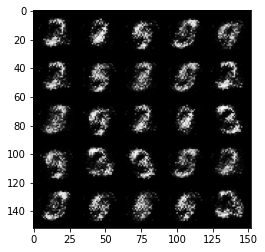

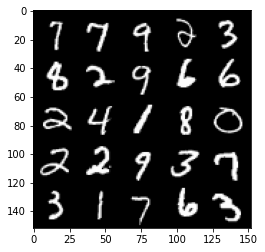

Step 5500: Generator loss: 3.5000323162078883, discriminator loss: 0.07191803564131263


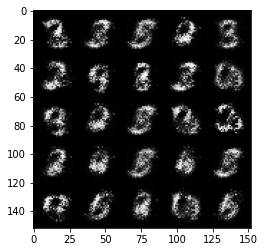

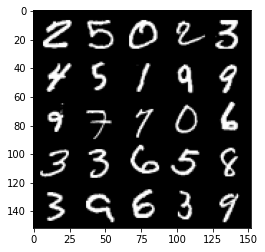

Step 6000: Generator loss: 3.7306371932029734, discriminator loss: 0.07114213477820161


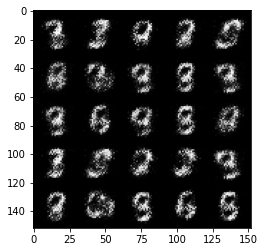

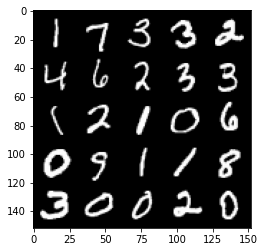

Step 6500: Generator loss: 3.7902004413604744, discriminator loss: 0.080785872861743


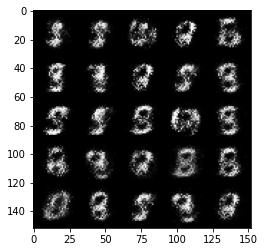

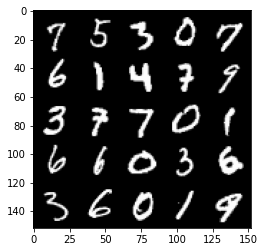

Step 7000: Generator loss: 3.864147652149202, discriminator loss: 0.06178763207793237


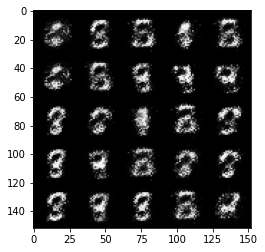

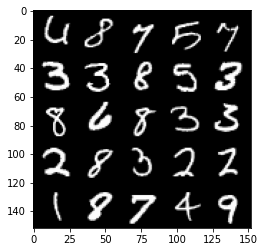

Step 7500: Generator loss: 3.963019310951233, discriminator loss: 0.053283752035349574


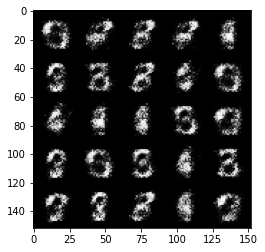

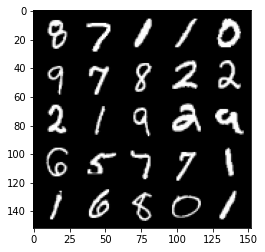

Step 8000: Generator loss: 4.016229864120482, discriminator loss: 0.054262429781258115


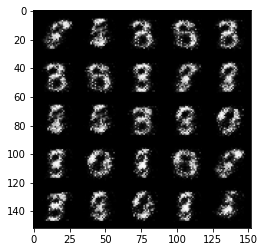

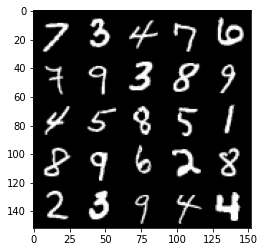

Step 8500: Generator loss: 4.132535938739778, discriminator loss: 0.05372798190638424


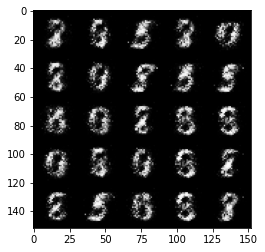

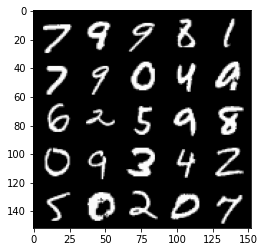

Step 9000: Generator loss: 3.8515338153839123, discriminator loss: 0.061868439424782984


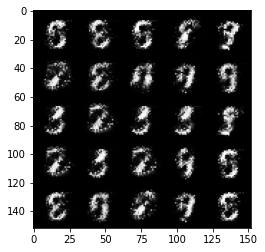

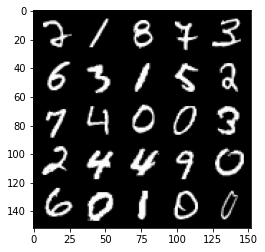

Step 9500: Generator loss: 4.016058226585387, discriminator loss: 0.06159479614719743


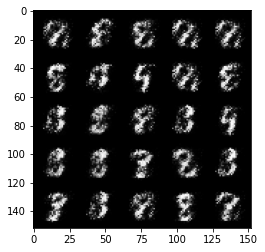

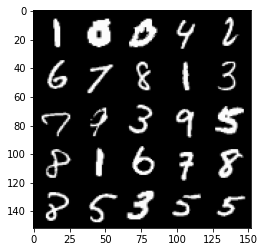

Step 10000: Generator loss: 4.163917691230773, discriminator loss: 0.0631359504014254


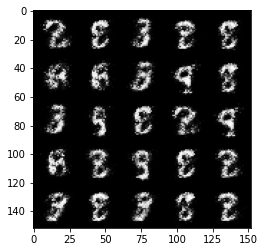

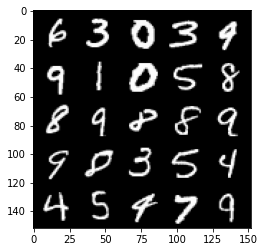

Step 10500: Generator loss: 4.1541269173622135, discriminator loss: 0.0567560384608805


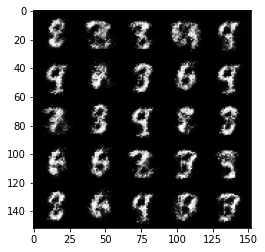

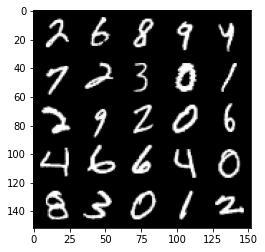

Step 11000: Generator loss: 4.005527558803558, discriminator loss: 0.06929931761324407


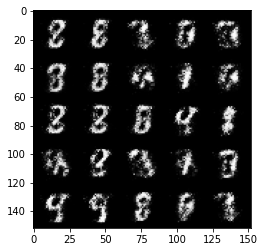

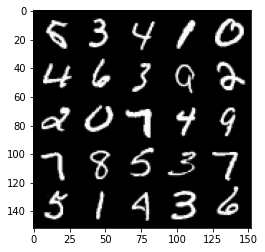

Step 11500: Generator loss: 3.9400561699867276, discriminator loss: 0.0747148956134916


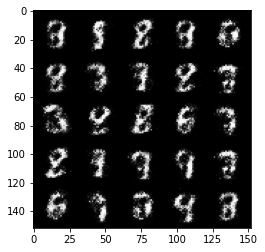

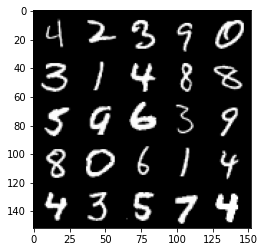

Step 12000: Generator loss: 3.773474839210511, discriminator loss: 0.07417332320287828


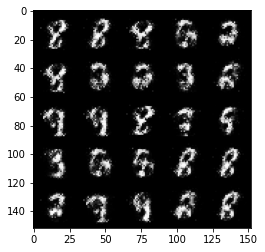

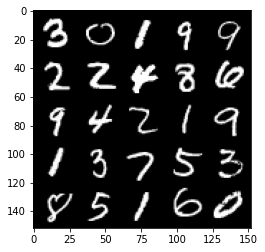

Step 12500: Generator loss: 3.9593124127388006, discriminator loss: 0.0723070152252912


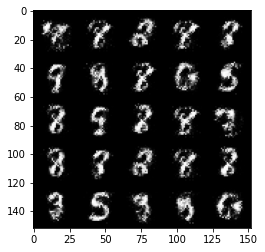

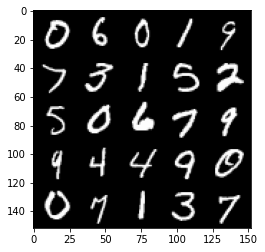

Step 13000: Generator loss: 4.053801211357118, discriminator loss: 0.06368653961271036


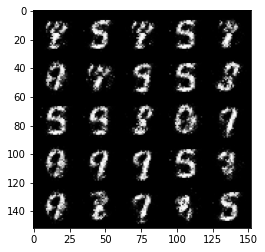

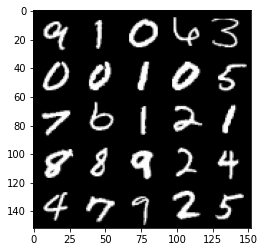

Step 13500: Generator loss: 4.094301696300507, discriminator loss: 0.08186738488078123


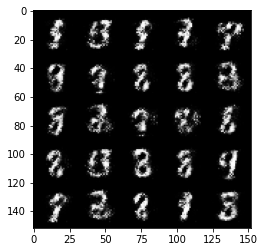

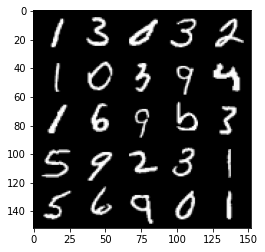

Step 14000: Generator loss: 3.8163211593627917, discriminator loss: 0.08655033805221317


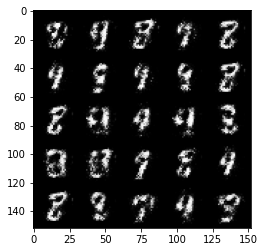

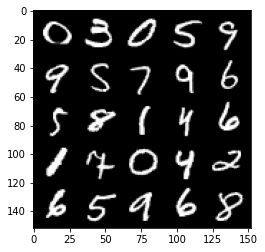

Step 14500: Generator loss: 3.88398527574539, discriminator loss: 0.0880763018876315


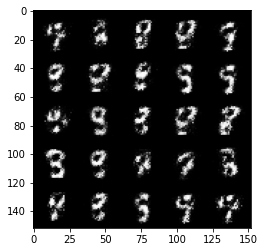

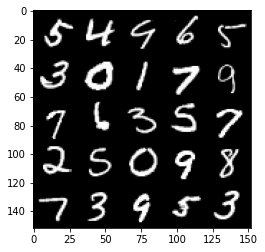

Step 15000: Generator loss: 4.011262826919554, discriminator loss: 0.09039122799783947


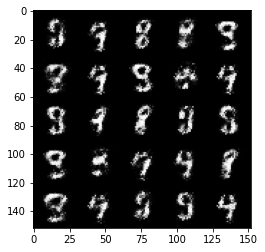

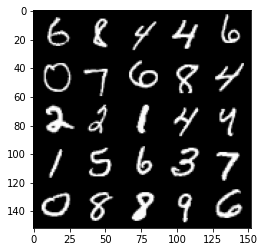

Step 15500: Generator loss: 4.02560912656784, discriminator loss: 0.09845998871326447


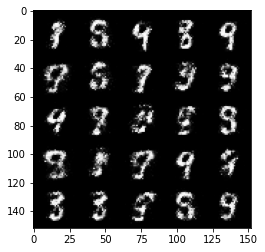

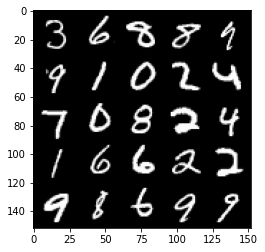

Step 16000: Generator loss: 3.8690538849830607, discriminator loss: 0.10454985067993391


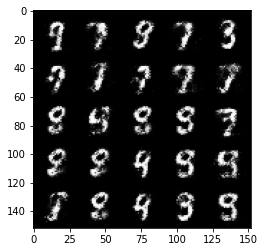

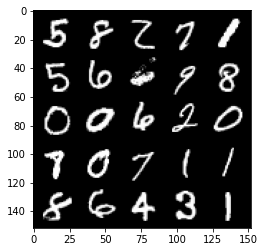

Step 16500: Generator loss: 3.623048661708837, discriminator loss: 0.10060853151232002


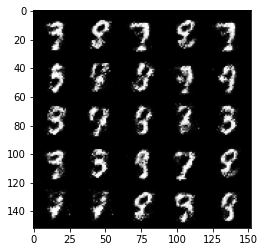

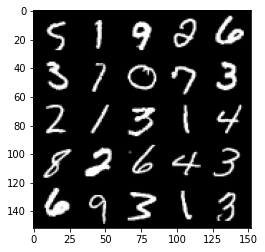

Step 17000: Generator loss: 3.731216964244844, discriminator loss: 0.09668470704555507


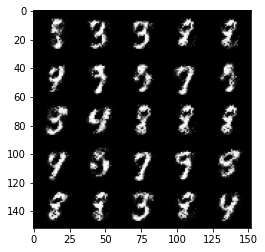

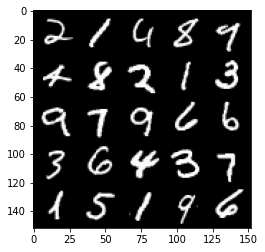

Step 17500: Generator loss: 3.6262738227844196, discriminator loss: 0.10949497205764061


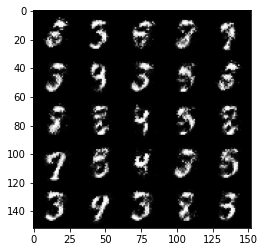

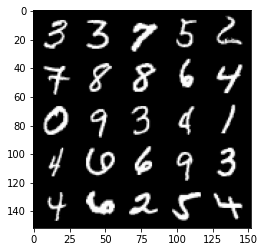

Step 18000: Generator loss: 3.7012559518814077, discriminator loss: 0.12106752390414487


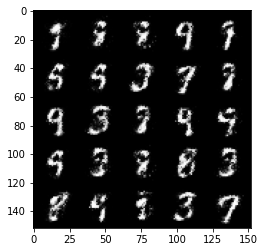

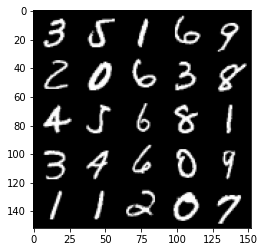

Step 18500: Generator loss: 3.531242877006532, discriminator loss: 0.13756864468753333


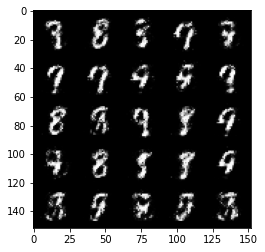

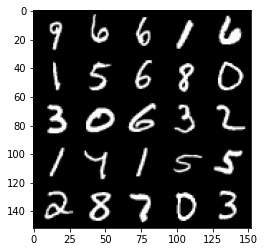

Step 19000: Generator loss: 3.347485461711883, discriminator loss: 0.12929726693034177


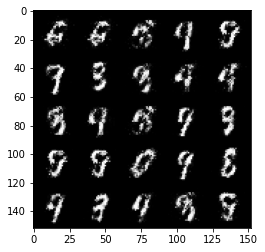

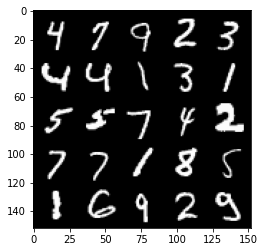

Step 19500: Generator loss: 3.362325799465181, discriminator loss: 0.1421071296781302


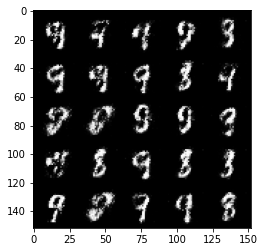

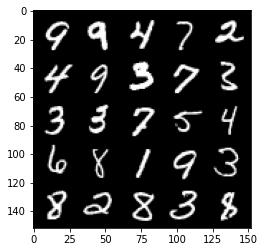

Step 20000: Generator loss: 3.4786125602722144, discriminator loss: 0.1453242353647947


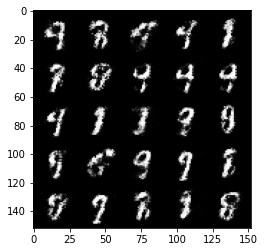

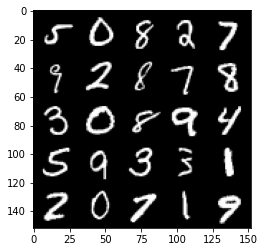

Step 20500: Generator loss: 3.3254583778381344, discriminator loss: 0.15802443641424185


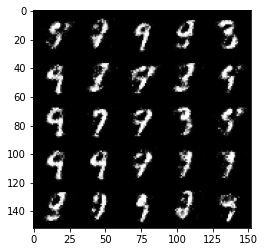

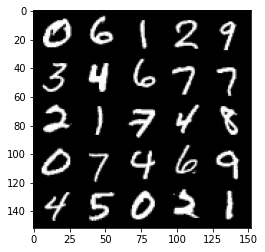

Step 21000: Generator loss: 3.1530417475700374, discriminator loss: 0.17029881955683238


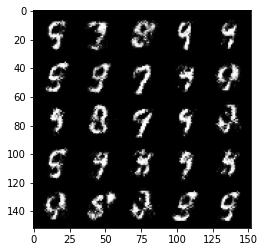

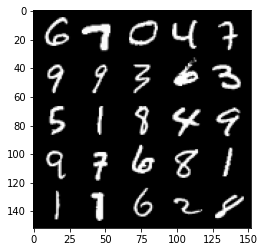

Step 21500: Generator loss: 3.2826416440010084, discriminator loss: 0.14992987243831155


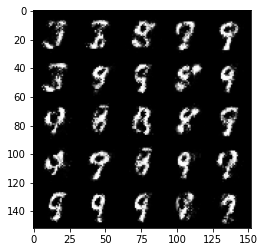

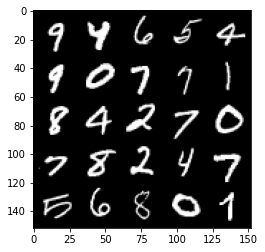

Step 22000: Generator loss: 3.1808203392028847, discriminator loss: 0.16926831772923479


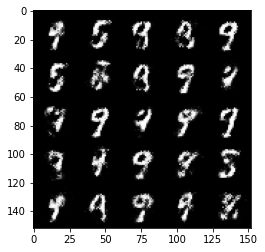

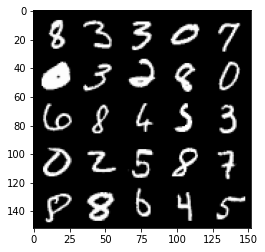

Step 22500: Generator loss: 3.1395929741859434, discriminator loss: 0.1623540572226048


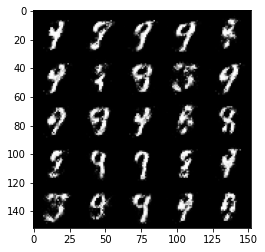

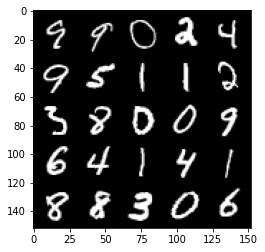

Step 23000: Generator loss: 3.1093878612518293, discriminator loss: 0.16119369029998773


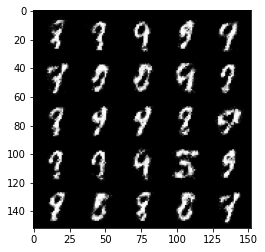

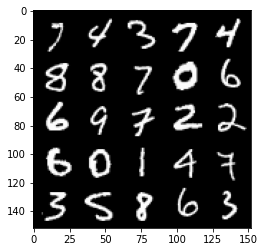

Step 23500: Generator loss: 3.1323455467224135, discriminator loss: 0.16198581890761846


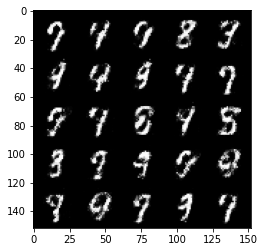

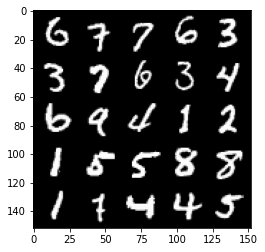

Step 24000: Generator loss: 2.991018073558808, discriminator loss: 0.18506973138451566


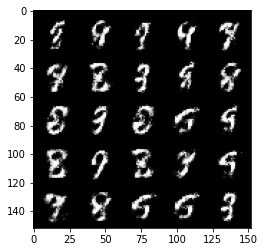

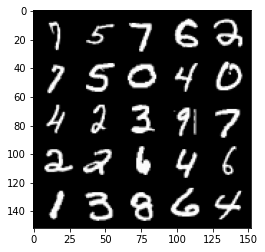

Step 24500: Generator loss: 2.9588347263336185, discriminator loss: 0.18931969825923448


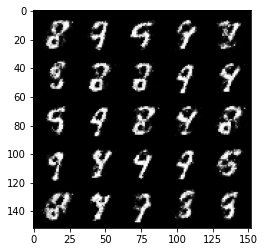

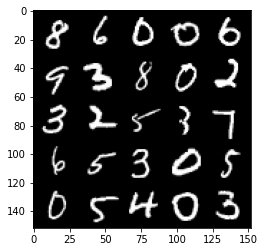

Step 25000: Generator loss: 2.863368416309358, discriminator loss: 0.18032341709733013


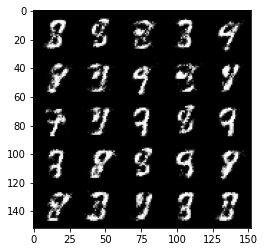

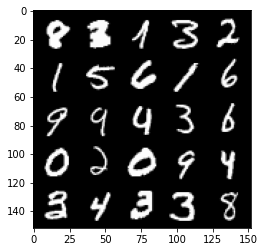

Step 25500: Generator loss: 2.772860311031342, discriminator loss: 0.21654915431141844


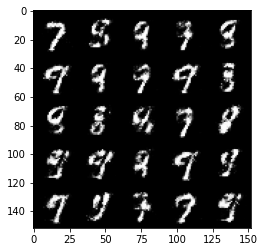

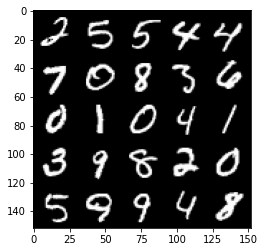

Step 26000: Generator loss: 2.8199012603759788, discriminator loss: 0.1981375077068805


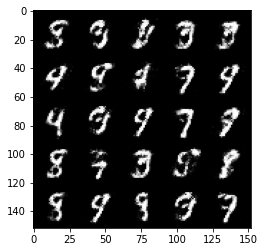

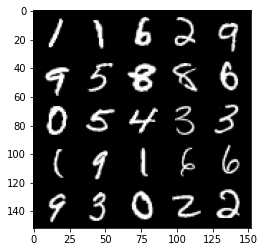

Step 26500: Generator loss: 2.7953827705383296, discriminator loss: 0.19274950705468644


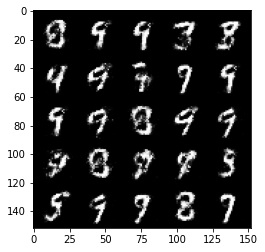

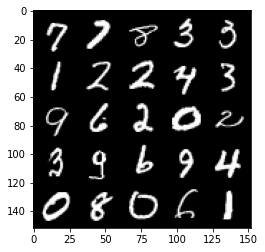

Step 27000: Generator loss: 2.7761190819740302, discriminator loss: 0.20468413248658168


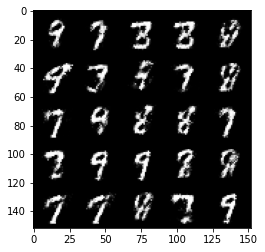

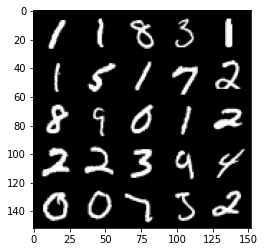

Step 27500: Generator loss: 2.734623843669893, discriminator loss: 0.2181919734477998


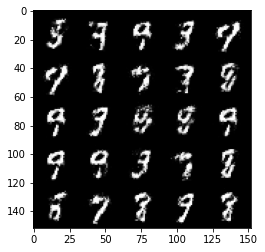

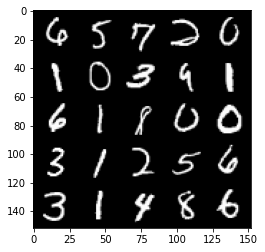

Step 28000: Generator loss: 2.827785520076751, discriminator loss: 0.20026089672744282


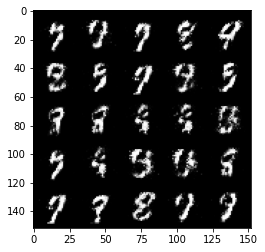

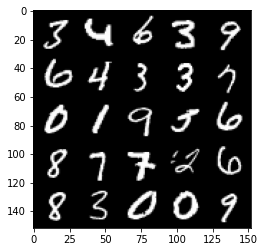

Step 28500: Generator loss: 2.9395664138793927, discriminator loss: 0.18586014197766798


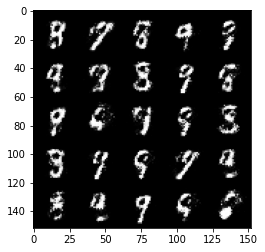

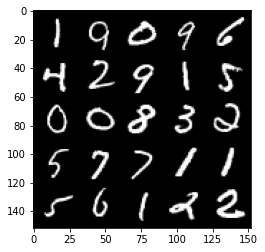

Step 29000: Generator loss: 2.793720152854918, discriminator loss: 0.2167618304640056


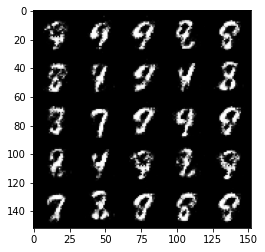

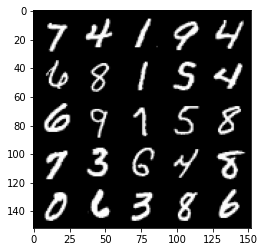

Step 29500: Generator loss: 2.7485266969203948, discriminator loss: 0.22730145418643954


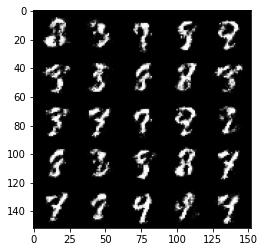

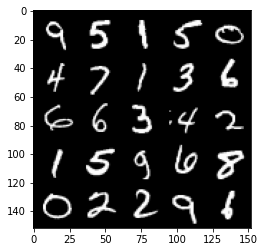

Step 30000: Generator loss: 2.784952075958254, discriminator loss: 0.22494994083046904


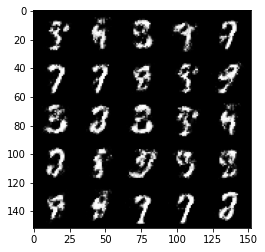

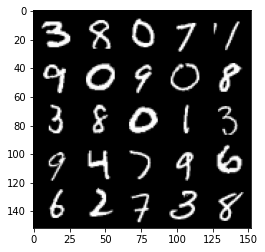

Step 30500: Generator loss: 2.7513112144470204, discriminator loss: 0.23299897159636


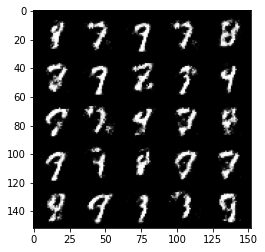

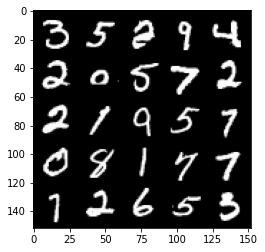

Step 31000: Generator loss: 2.663846162319184, discriminator loss: 0.2268918012380604


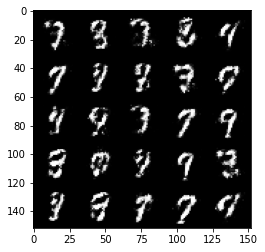

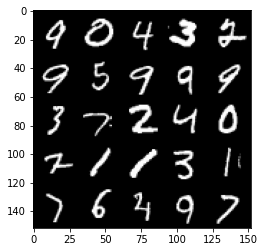

Step 31500: Generator loss: 2.7233875904083265, discriminator loss: 0.21524515949189651


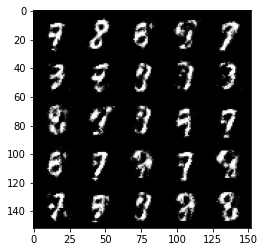

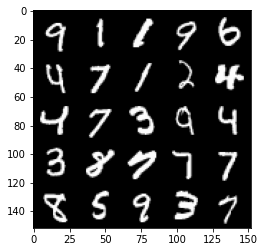

Step 32000: Generator loss: 2.81290989112854, discriminator loss: 0.2102619898319247


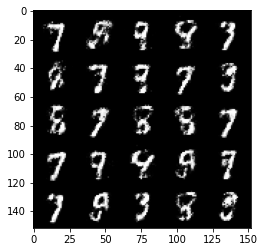

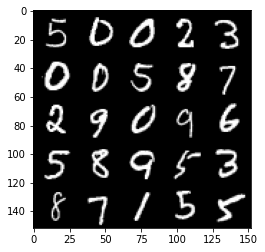

Step 32500: Generator loss: 2.55266952729225, discriminator loss: 0.24629450041055662


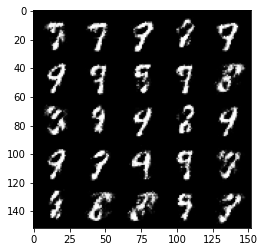

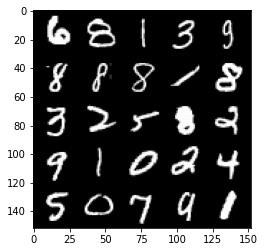

Step 33000: Generator loss: 2.5735316824913017, discriminator loss: 0.2236668897569181


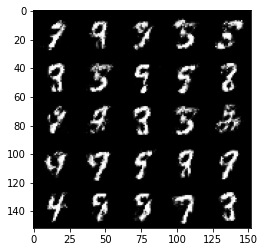

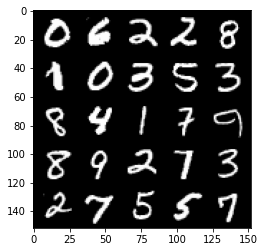

Step 33500: Generator loss: 2.5628923025131214, discriminator loss: 0.23073541343212112


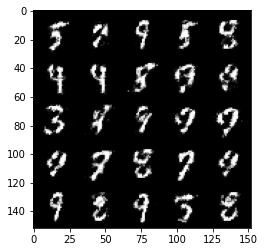

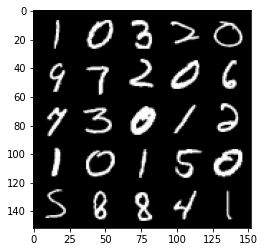

Step 34000: Generator loss: 2.488288045883179, discriminator loss: 0.24840731051564233


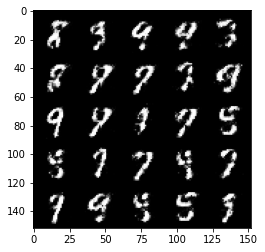

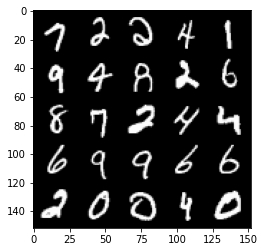

Step 34500: Generator loss: 2.5074431786537166, discriminator loss: 0.2312700498700141


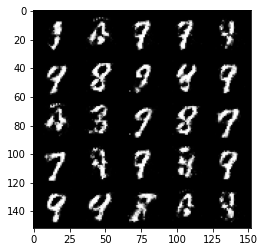

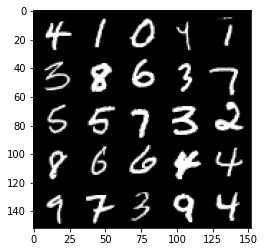

Step 35000: Generator loss: 2.412201114177704, discriminator loss: 0.25328496065735795


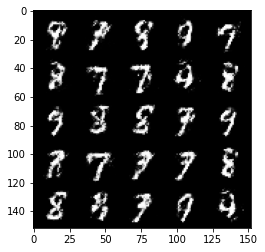

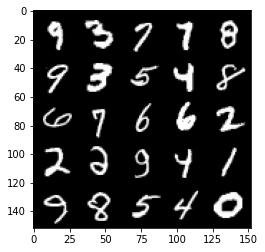

Step 35500: Generator loss: 2.458129823207852, discriminator loss: 0.24283684185147275


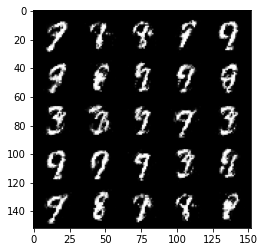

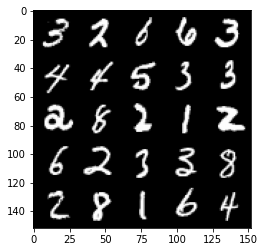

Step 36000: Generator loss: 2.514174939870834, discriminator loss: 0.2284061586558819


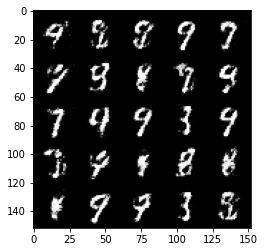

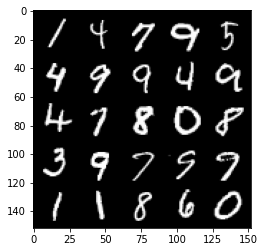

Step 36500: Generator loss: 2.506961158752441, discriminator loss: 0.2362853619754316


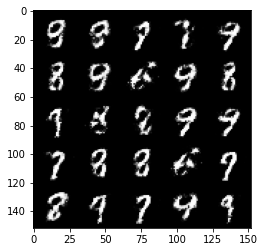

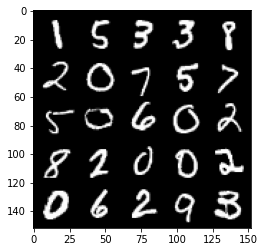

Step 37000: Generator loss: 2.363314796924592, discriminator loss: 0.26932853603363066


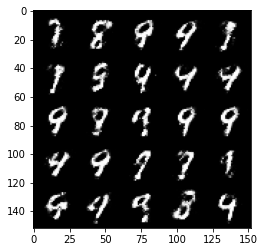

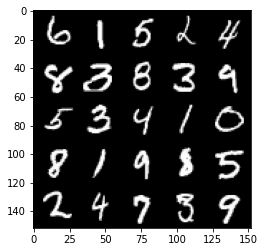

Step 37500: Generator loss: 2.3423790740966792, discriminator loss: 0.26699749216437335


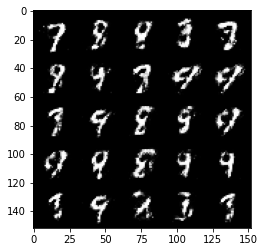

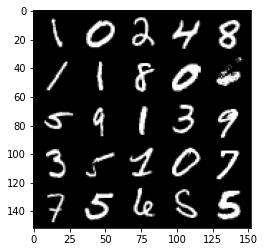

Step 38000: Generator loss: 2.4033279170989994, discriminator loss: 0.2665303458869458


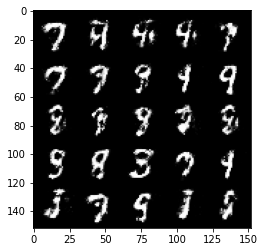

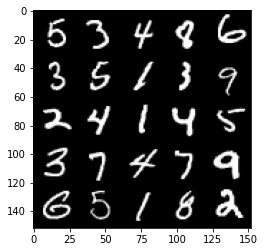

Step 38500: Generator loss: 2.4327723963260643, discriminator loss: 0.24709921517968186


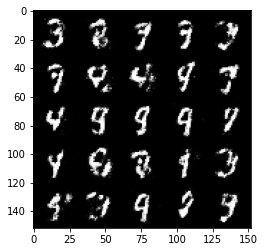

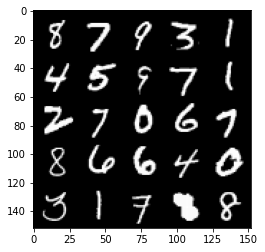

Step 39000: Generator loss: 2.401784383058549, discriminator loss: 0.25750781416893015


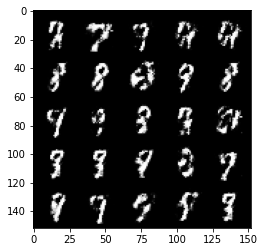

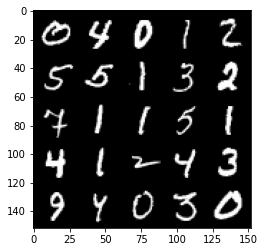

Step 39500: Generator loss: 2.2748891892433187, discriminator loss: 0.28248197424411753


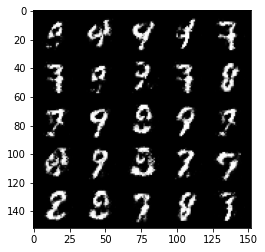

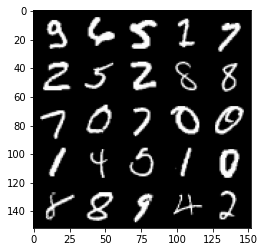

Step 40000: Generator loss: 2.3838141338825216, discriminator loss: 0.25912015885114664


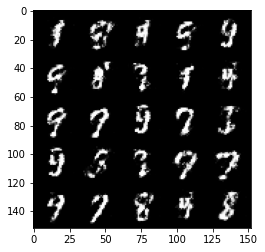

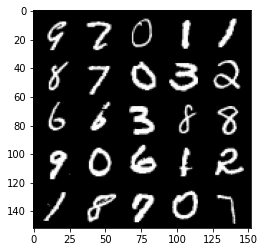

Step 40500: Generator loss: 2.321088050842285, discriminator loss: 0.2678183022737506


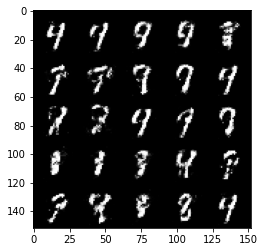

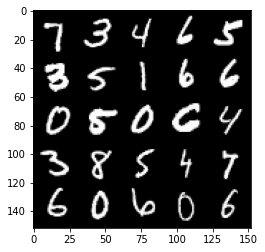

Step 41000: Generator loss: 2.2905947675704947, discriminator loss: 0.2751012636721136


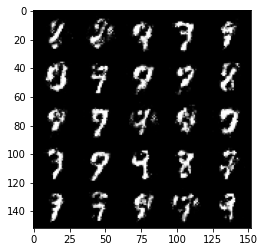

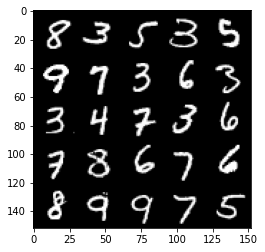

Step 41500: Generator loss: 2.2068044438362113, discriminator loss: 0.2846781996786594


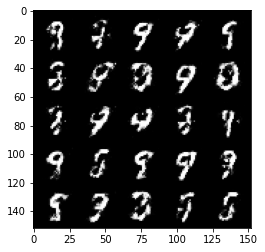

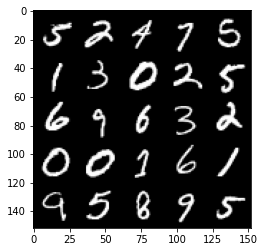

Step 42000: Generator loss: 2.226810721874238, discriminator loss: 0.2849228716194629


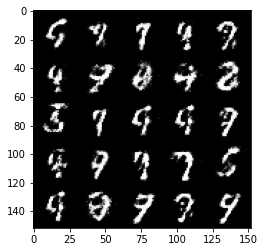

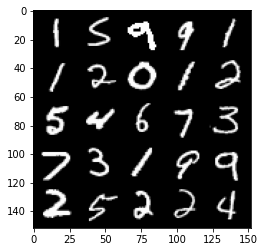

Step 42500: Generator loss: 2.3344514114856714, discriminator loss: 0.2567062282562256


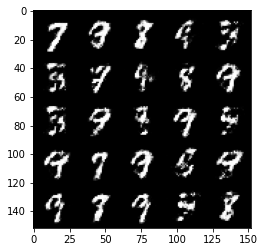

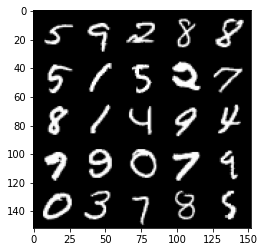

Step 43000: Generator loss: 2.272302812576294, discriminator loss: 0.2812343496382237


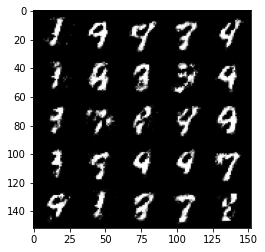

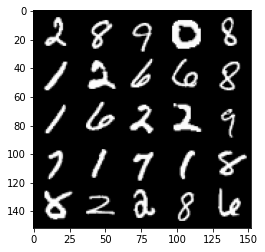

Step 43500: Generator loss: 2.2066091020107277, discriminator loss: 0.27931090626120547


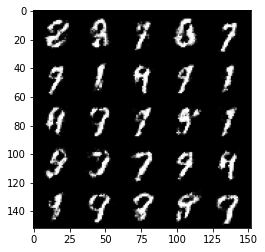

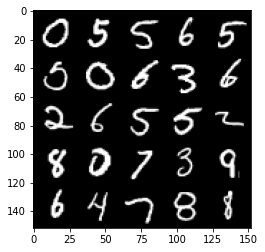

Step 44000: Generator loss: 2.176042522192001, discriminator loss: 0.2828429473042488


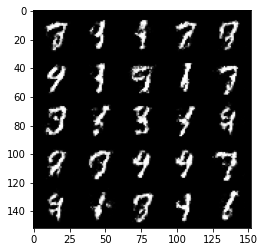

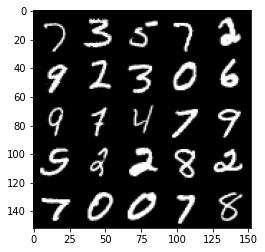

Step 44500: Generator loss: 2.151467856645586, discriminator loss: 0.3182707007825374


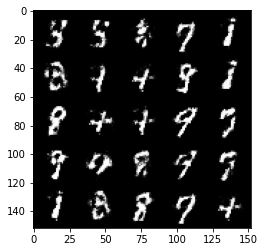

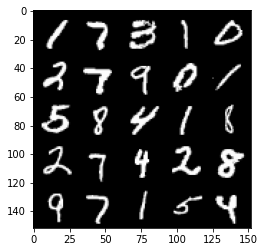

Step 45000: Generator loss: 2.121051900863647, discriminator loss: 0.2981491280794147


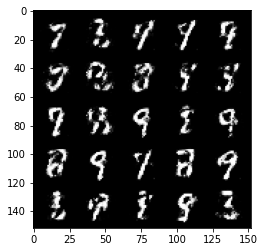

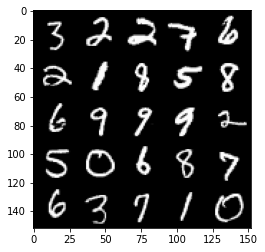

Step 45500: Generator loss: 2.1006627571582785, discriminator loss: 0.3132162948548793


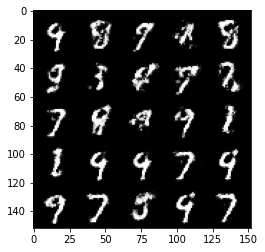

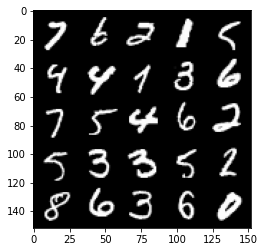

Step 46000: Generator loss: 2.104466944217682, discriminator loss: 0.3115527934432033


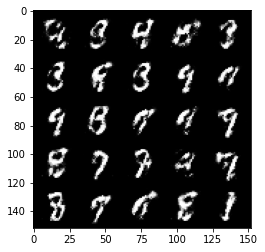

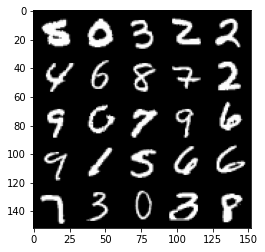

Step 46500: Generator loss: 2.0356692907810223, discriminator loss: 0.32317264077067376


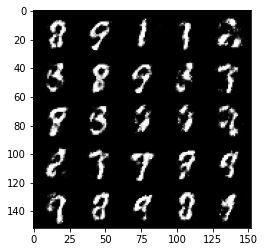

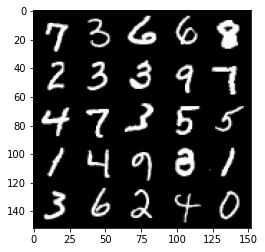

Step 47000: Generator loss: 1.9242867763042453, discriminator loss: 0.36020147526264246


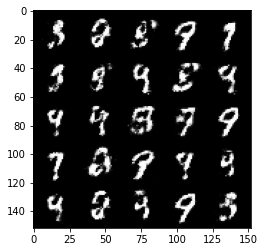

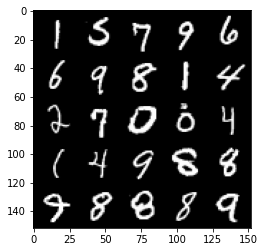

Step 47500: Generator loss: 1.9814458444118492, discriminator loss: 0.3167886663973333


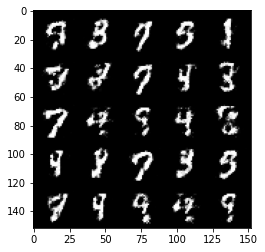

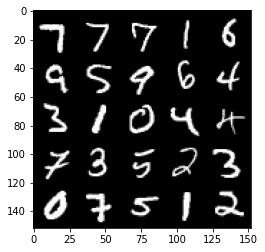

Step 48000: Generator loss: 2.090534571886061, discriminator loss: 0.29943946075439437


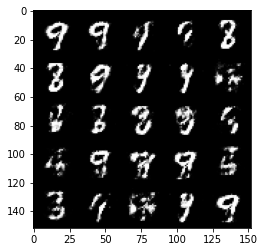

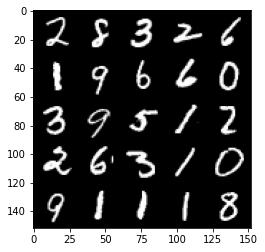

Step 48500: Generator loss: 2.0019917533397686, discriminator loss: 0.3186520757079124


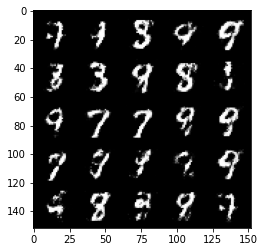

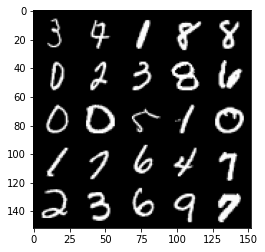

Step 49000: Generator loss: 2.0766833081245446, discriminator loss: 0.31134947571158406


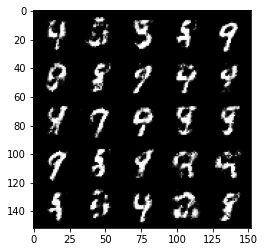

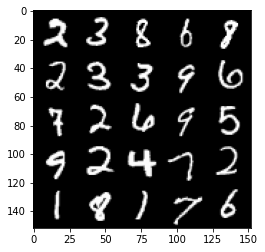

Step 49500: Generator loss: 2.0358432097434993, discriminator loss: 0.3166234422922135


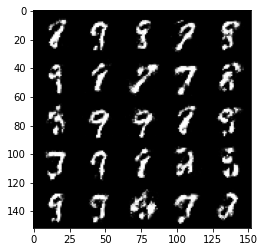

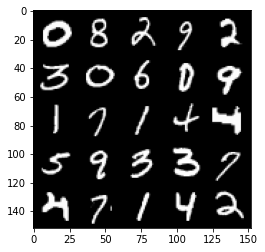

Step 50000: Generator loss: 2.0387803127765647, discriminator loss: 0.3139736909568309


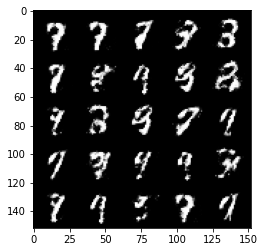

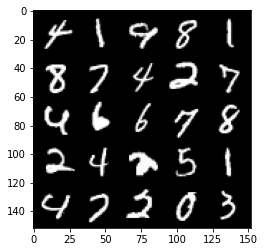

Step 50500: Generator loss: 1.973331080675125, discriminator loss: 0.3127326984107494


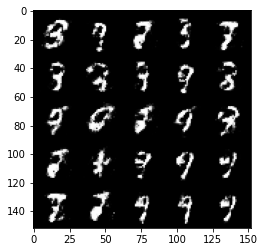

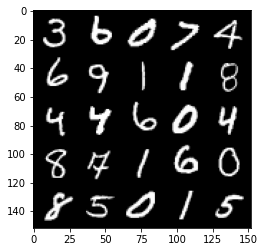

Step 51000: Generator loss: 2.063238533735275, discriminator loss: 0.3056162722408772


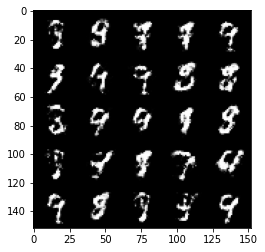

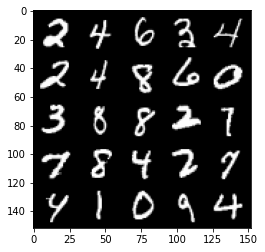

Step 51500: Generator loss: 2.0322413036823264, discriminator loss: 0.313861980617047


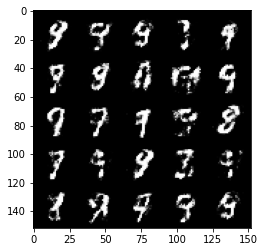

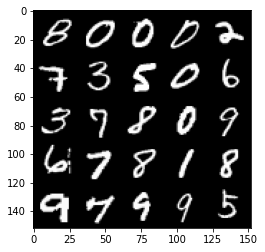

Step 52000: Generator loss: 2.053959154129027, discriminator loss: 0.3116217778623102


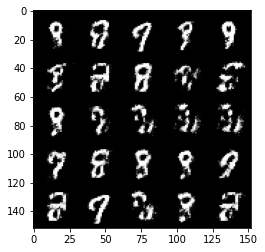

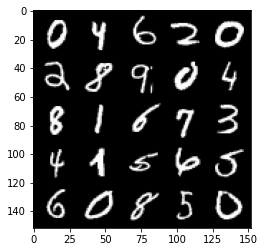

Step 52500: Generator loss: 2.0224256639480576, discriminator loss: 0.311851749897003


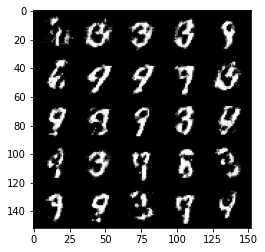

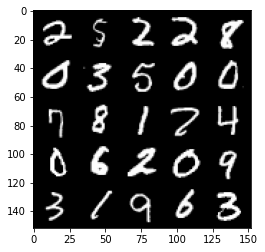

Step 53000: Generator loss: 1.973017963171004, discriminator loss: 0.3235063882172107


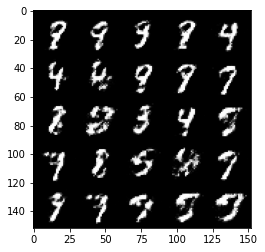

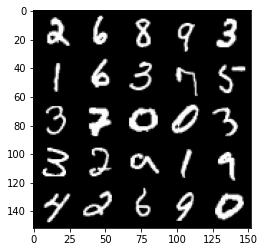

Step 53500: Generator loss: 2.0566097593307497, discriminator loss: 0.3114107569158078


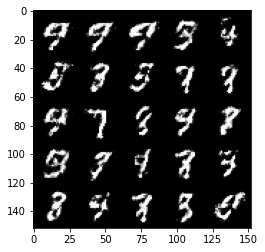

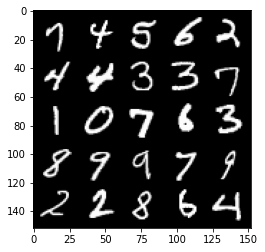

Step 54000: Generator loss: 1.9363665435314172, discriminator loss: 0.3250338380038737


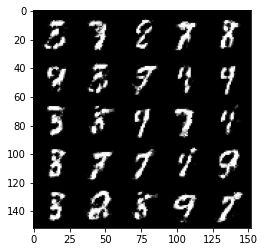

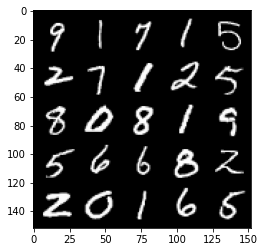

Step 54500: Generator loss: 1.8912539918422708, discriminator loss: 0.33993338665366185


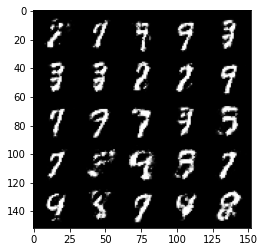

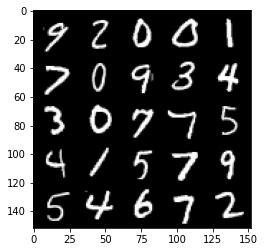

Step 55000: Generator loss: 1.9526306903362274, discriminator loss: 0.3315319694578647


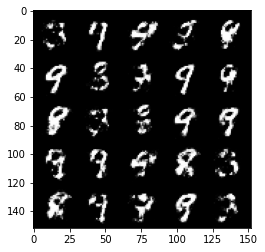

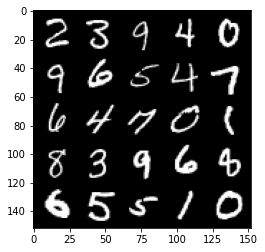

Step 55500: Generator loss: 1.8947418696880345, discriminator loss: 0.3241726349890236


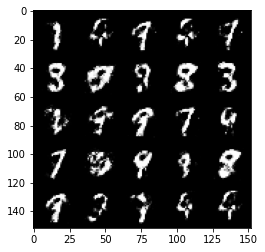

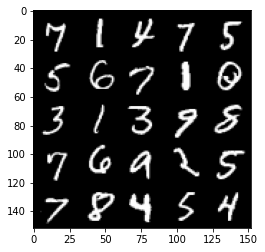

Step 56000: Generator loss: 1.9049308650493644, discriminator loss: 0.33072074660658807


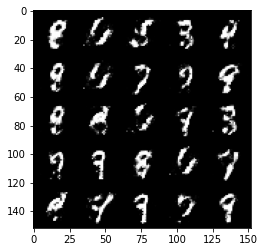

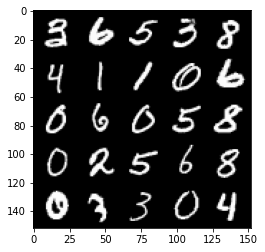

Step 56500: Generator loss: 1.8786100881099703, discriminator loss: 0.33901687204837766


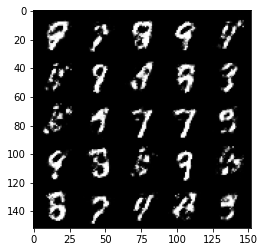

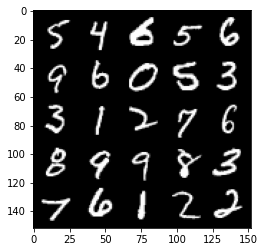

Step 57000: Generator loss: 1.7982098119258882, discriminator loss: 0.36795574992895136


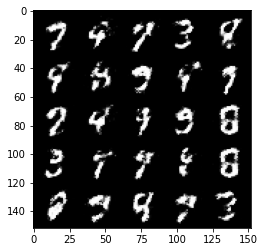

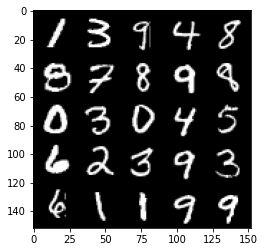

Step 57500: Generator loss: 1.8586538710594183, discriminator loss: 0.33582143977284434


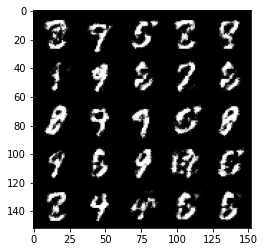

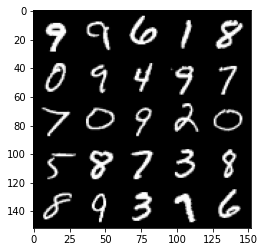

Step 58000: Generator loss: 1.8358392150402096, discriminator loss: 0.3579455693364143


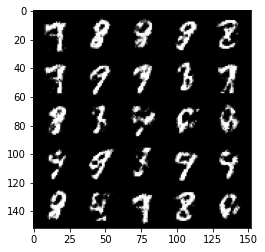

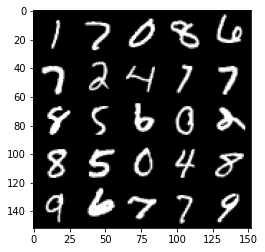

Step 58500: Generator loss: 1.7354451992511735, discriminator loss: 0.39272743988037134


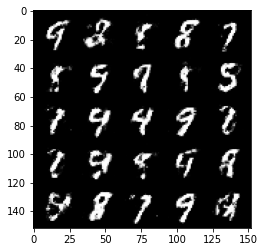

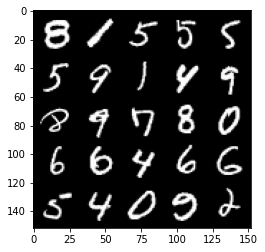

Step 59000: Generator loss: 1.7914791715145102, discriminator loss: 0.3648420309424402


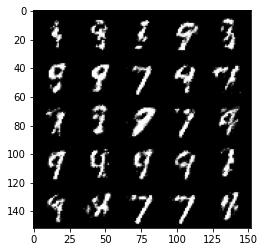

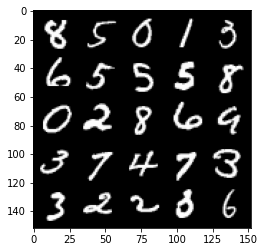

Step 59500: Generator loss: 1.7182467365264895, discriminator loss: 0.3719901914596558


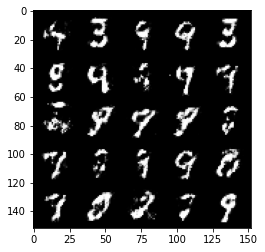

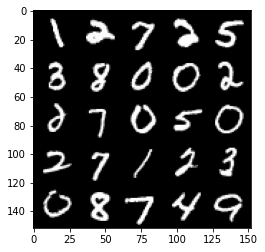

Step 60000: Generator loss: 1.7802798593044278, discriminator loss: 0.35839844024181405


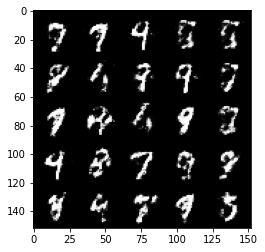

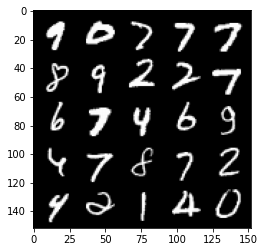

Step 60500: Generator loss: 1.6485901987552662, discriminator loss: 0.412483794093132


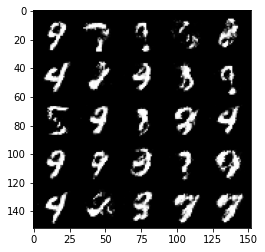

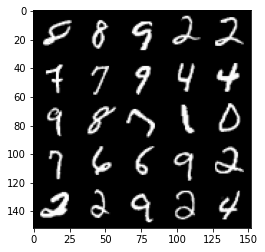

Step 61000: Generator loss: 1.810332182645798, discriminator loss: 0.340742356300354


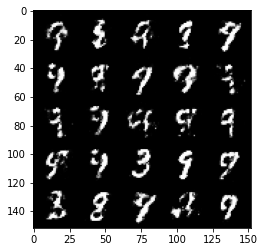

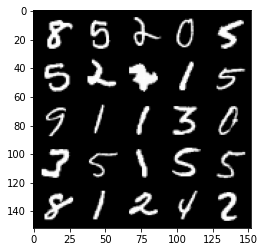

Step 61500: Generator loss: 1.7425444719791403, discriminator loss: 0.3716264346241951


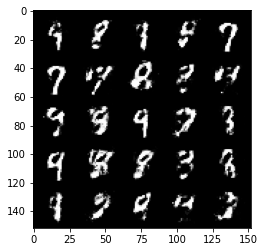

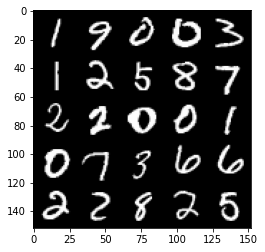

Step 62000: Generator loss: 1.775418444871903, discriminator loss: 0.3586462761163711


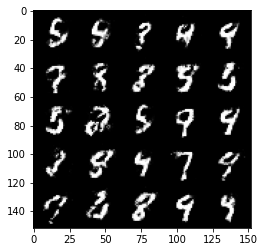

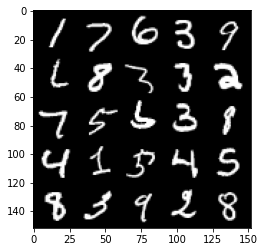

Step 62500: Generator loss: 1.6719534718990332, discriminator loss: 0.3877589083313945


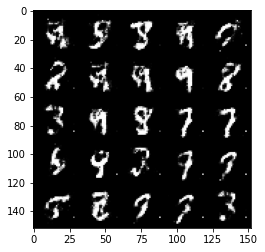

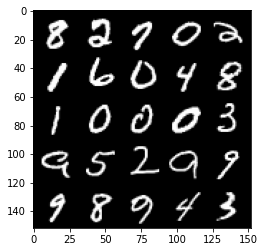

Step 63000: Generator loss: 1.8769107849597948, discriminator loss: 0.3324648067057134


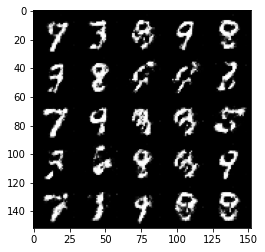

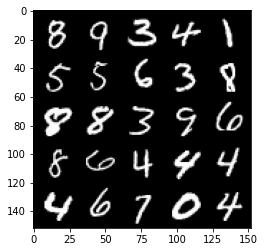

Step 63500: Generator loss: 1.7860422761440282, discriminator loss: 0.3599716291725633


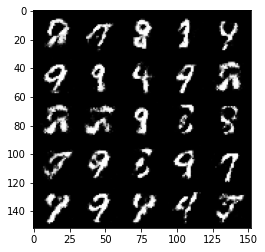

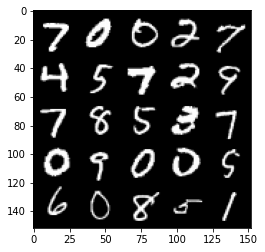

Step 64000: Generator loss: 1.6151041300296762, discriminator loss: 0.396341229856014


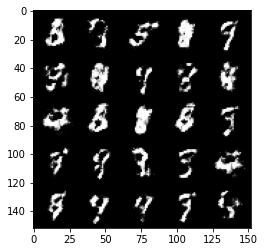

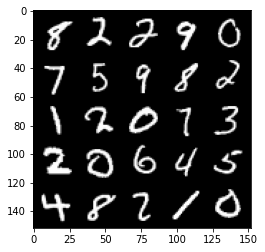

Step 64500: Generator loss: 1.6720653340816496, discriminator loss: 0.38052702838182445


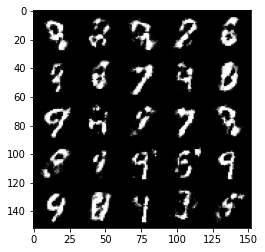

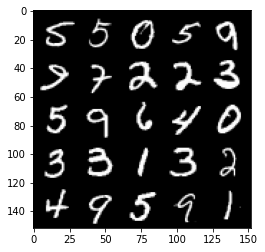

Step 65000: Generator loss: 1.620189990043641, discriminator loss: 0.3946074429154398


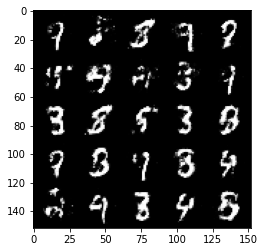

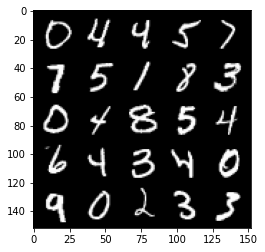

Step 65500: Generator loss: 1.7048768563270558, discriminator loss: 0.3726939707398414


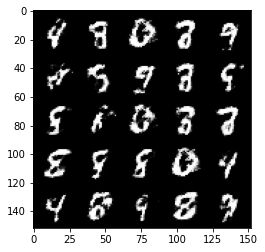

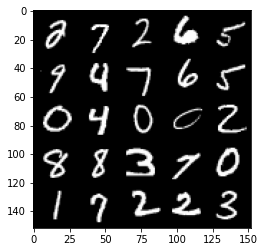

Step 66000: Generator loss: 1.7178817310333259, discriminator loss: 0.36530622905492816


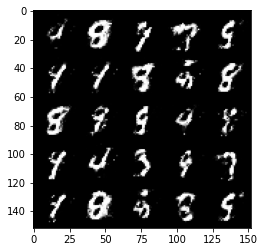

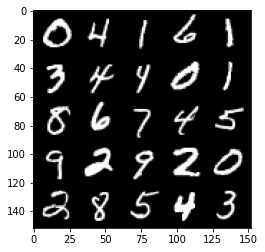

Step 66500: Generator loss: 1.6934350419044502, discriminator loss: 0.3761888162493704


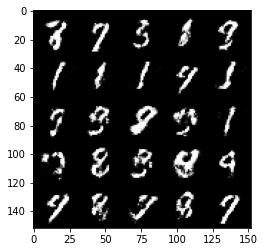

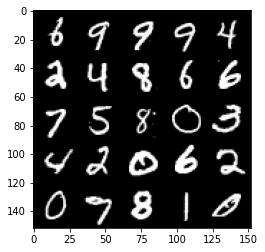

Step 67000: Generator loss: 1.6710817124843589, discriminator loss: 0.3868570020198821


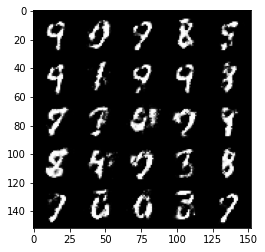

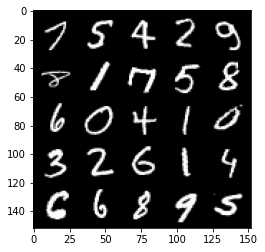

Step 67500: Generator loss: 1.6923702728748324, discriminator loss: 0.36962392407655714


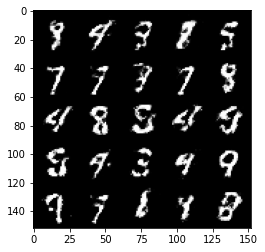

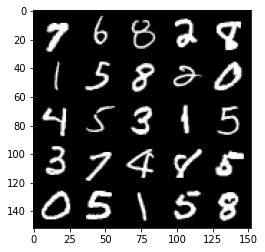

Step 68000: Generator loss: 1.6694800858497623, discriminator loss: 0.38179182136058815


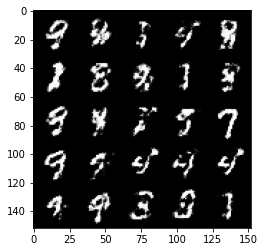

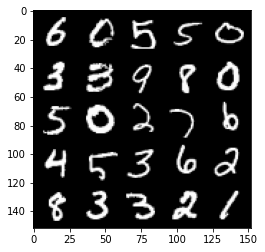

Step 68500: Generator loss: 1.6390720195770254, discriminator loss: 0.3954544620513916


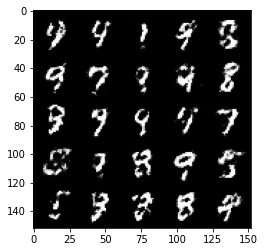

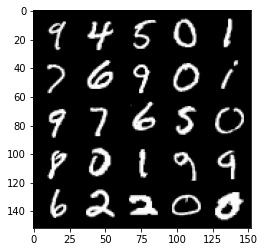

Step 75500: Generator loss: 1.603744169950486, discriminator loss: 0.39848407107591616


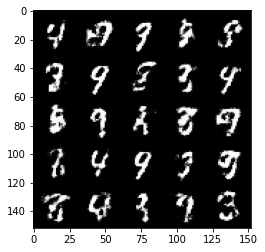

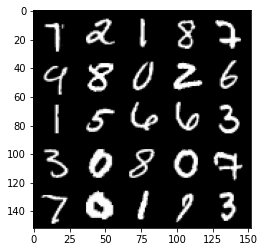

Step 76000: Generator loss: 1.5636402971744536, discriminator loss: 0.41738697016239146


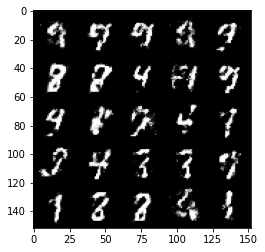

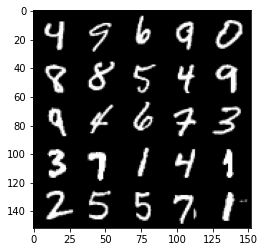

Step 76500: Generator loss: 1.4547393064498908, discriminator loss: 0.4450557223558427


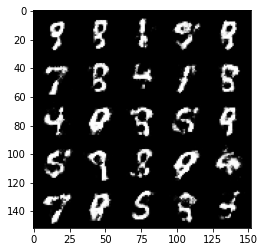

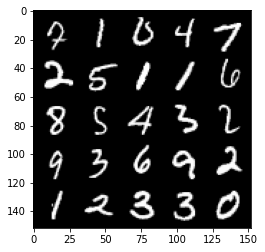

Step 77000: Generator loss: 1.5221893687248227, discriminator loss: 0.4309090791344641


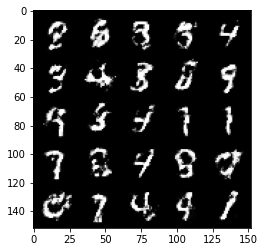

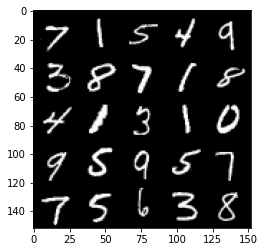

Step 77500: Generator loss: 1.4416271724700935, discriminator loss: 0.450274125397205


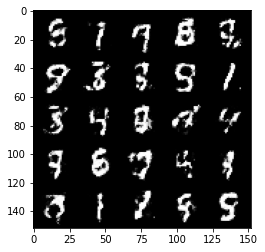

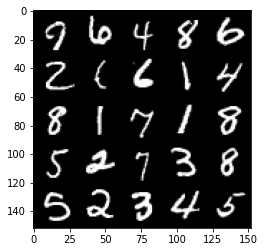

Step 78000: Generator loss: 1.4775152904987336, discriminator loss: 0.4258355212807656


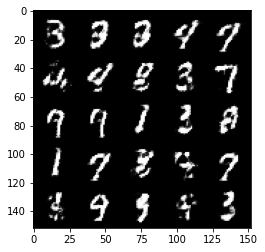

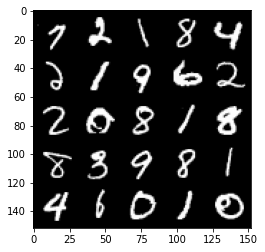

Step 78500: Generator loss: 1.4204990427494049, discriminator loss: 0.44777002066373844


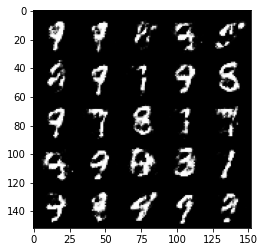

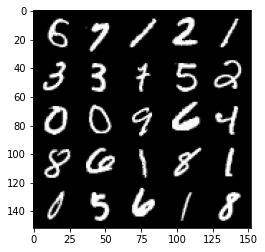

Step 79000: Generator loss: 1.3956030917167654, discriminator loss: 0.45037339437007934


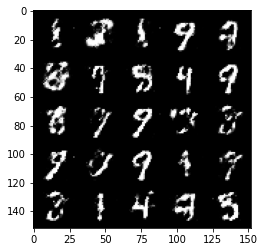

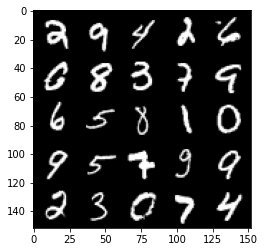

Step 79500: Generator loss: 1.409455886125565, discriminator loss: 0.4531542370319369


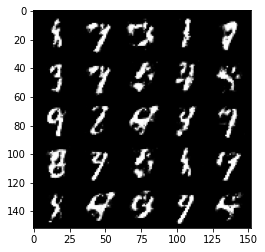

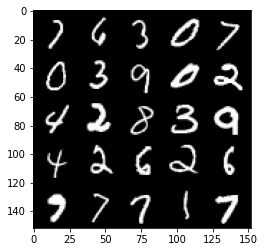

Step 80000: Generator loss: 1.3597908542156225, discriminator loss: 0.46884692734479844


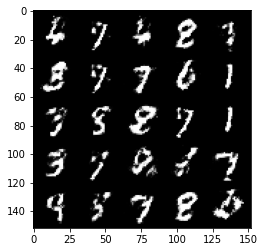

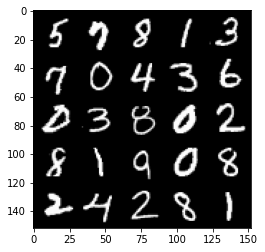

Step 80500: Generator loss: 1.3577158987522127, discriminator loss: 0.4702653094530101


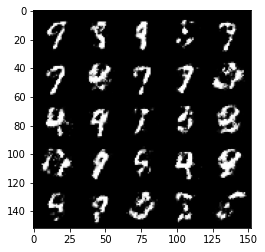

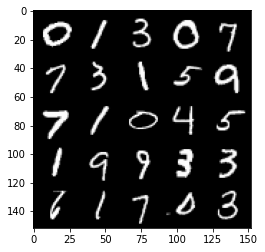

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [48]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
